In [1]:
%cd /Users/ezb/Jupyter\ notebooks/datasets

/Users/ezb/Jupyter notebooks/datasets


In [163]:
import pandas as pd 
df = pd.read_csv('DC_Properties.csv', low_memory=False)

In [164]:
df.columns

Index(['Unnamed: 0', 'BATHRM', 'HF_BATHRM', 'HEAT', 'AC', 'NUM_UNITS', 'ROOMS',
       'BEDRM', 'AYB', 'YR_RMDL', 'EYB', 'STORIES', 'SALEDATE', 'PRICE',
       'QUALIFIED', 'SALE_NUM', 'GBA', 'BLDG_NUM', 'STYLE', 'STRUCT', 'GRADE',
       'CNDTN', 'EXTWALL', 'ROOF', 'INTWALL', 'KITCHENS', 'FIREPLACES',
       'USECODE', 'LANDAREA', 'GIS_LAST_MOD_DTTM', 'SOURCE', 'CMPLX_NUM',
       'LIVING_GBA', 'FULLADDRESS', 'CITY', 'STATE', 'ZIPCODE', 'NATIONALGRID',
       'LATITUDE', 'LONGITUDE', 'ASSESSMENT_NBHD', 'ASSESSMENT_SUBNBHD',
       'CENSUS_TRACT', 'CENSUS_BLOCK', 'WARD', 'SQUARE', 'X', 'Y', 'QUADRANT'],
      dtype='object')

In [165]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from xgboost.sklearn import XGBRegressor
from yellowbrick.regressor import PredictionError, ResidualsPlot
import category_encoders as ce
import scipy.stats as st
import shap
import matplotlib.pyplot as plt
import plotly.express as px
plt.style.use('seaborn-colorblind')

def datawrangle(x):
    # make copy
    x = x.copy()

    # drop X and Y because they're the same as LONGITUDE and LATITUDE
    x = x.drop(columns=['X', 'Y'])

    # drop redundant or useless columns
    x = x.drop(columns=['Unnamed: 0', 'STATE', 'CITY', 'SOURCE', 'FULLADDRESS', 'NATIONALGRID'])

    # drop null values in price since that's our target
    x = x.dropna(subset=['PRICE'], how='any')
    
    # drop duplicates
    x = x.drop_duplicates(subset=['PRICE', 'SALEDATE'])
    
    x = x[(x['PRICE'] >= np.percentile(x['PRICE'], 1)) & 
        (x['PRICE'] <= np.percentile(x['PRICE'], 99))]

    return x

df = datawrangle(df)

df.shape

(93124, 41)

In [154]:
fig = px.scatter_mapbox(df, lat='LATITUDE', lon='LONGITUDE', color='PRICE', opacity=0.1)
fig.update_layout(mapbox_style='stamen-terrain')
fig.show()

In [151]:
target = 'PRICE'

y_pred = df[target].mean()
pred = df.copy()
pred['pred'] = y_pred


print('Mean Baseline Root Mean Squared Error:', np.sqrt(mean_squared_error(df[target], pred['pred'])))
print('Mean Baseline Mean Absolute Error:', mean_absolute_error(df[target], pred['pred']))
print('Mean Baseline R^2 Score:', r2_score(df[target], pred['pred']))

Mean Baseline Root Mean Squared Error: 352230.027125104
Mean Baseline Mean Absolute Error: 261435.17269016054
Mean Baseline R^2 Score: 0.0


In [166]:
# test train split
target = 'PRICE'

train, test = train_test_split(
    df, test_size=.25, random_state=0
)

x_train = train.drop(columns=target)
y_train = train[target]
x_test = test.drop(columns=target)
y_test = test[target]

x_train.shape, y_train.shape, x_test.shape, y_test.shape

((69843, 40), (69843,), (23281, 40), (23281,))

In [99]:
# define encoder
encoder = ce.OrdinalEncoder()

# define model
model = XGBRegressor(
    nthreads=-1
)

# encode features for both train and test
x_train_encoded = encoder.fit_transform(x_train)
x_test_encoded = encoder.fit_transform(x_test)

# fit model for encoded features
model.fit(x_train_encoded, y_train)

//anaconda3/envs/lsds_unit2/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
//anaconda3/envs/lsds_unit2/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[09:18:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, nthreads=-1, objective='reg:linear',
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)

In [82]:
# get model score (mse, mae, and r2)
y_pred_train = model.predict(x_train_encoded)
y_pred_test = model.predict(x_test_encoded)
    
print('Train Root Mean Squared Error:', np.sqrt(mean_squared_error(y_train, y_pred_train)))
print('Validation Root Mean Square Error:', np.sqrt(mean_squared_error(y_test, y_pred_test)))
print('Train Mean Absolute Error:', mean_absolute_error(y_train, y_pred_train))
print('Validation Mean Absolute Error:', mean_absolute_error(y_test, y_pred_test))
print('Train R^2 Score:', r2_score(y_train, y_pred_train))
print('Validation R^2 Score:', r2_score(y_test, y_pred_test))

Train Root Mean Squared Error: 160580.19773445363
Validation Root Mean Square Error: 162817.30878097104
Train Mean Absolute Error: 108870.99268563611
Validation Mean Absolute Error: 110187.49220256151
Train R^2 Score: 0.7928406778166507
Validation R^2 Score: 0.78419585112634


In [92]:
# search parameters for RandomizedSearchCV

params = {  
    "max_depth": st.randint(3, 40),
    "learning_rate": st.uniform(0.05, 0.4),
    "colsample_bytree": st.beta(10, 1),
    "subsample": st.beta(10, 1),
    "gamma": st.uniform(0, 10),
    'reg_alpha': st.expon(0, 50),
    "min_child_weight": st.expon(0, 50),
}

# let's search for best param
search = RandomizedSearchCV(
    model, 
    params, 
    n_iter=20, 
    cv=2, 
    scoring='r2',
    verbose=10, 
    return_train_score=True, 
    random_state=0,
    n_jobs=-1
)

search.fit(x_train_encoded, y_train)

Fitting 2 folds for each of 20 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  8.4min
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done  38 out of  40 | elapsed: 16.3min remaining:   51.6s
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed: 17.0min finished


[08:35:30] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=2, error_score='raise-deprecating',
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1, gamma=0,
                                          importance_type='gain',
                                          learning_rate=0.1, max_delta_step=0,
                                          max_depth=3, min_child_weight=1,
                                          missing=None, n_estimators=100,
                                          n_jobs=1, nthread=None, nthreads=-1,
                                          objective='reg:linea...
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x1a1f847710>,
                                        'min_child_weight': <scipy.stats._distn_infrastructure.rv_frozen obj

In [100]:
# Best hyperparameters and CV accuracy score
print('Best hyperparameters', search.best_params_)
print('Cross-validation Score', search.best_score_)
model = search.best_estimator_

Best hyperparameters {'colsample_bytree': 0.9116390107929887, 'gamma': 7.3926357939830165, 'learning_rate': 0.06567511690172828, 'max_depth': 26, 'min_child_weight': 32.782313697880426, 'reg_alpha': 58.343675773115145, 'subsample': 0.8154057577981267}
Cross-validation Score 0.827549567671906


In [95]:
y_pred_train = model.predict(x_train_encoded)
y_pred_test = model.predict(x_test_encoded)
    
print('Train Root Mean Squared Error:', np.sqrt(mean_squared_error(y_train, y_pred_train)))
print('Test Root Mean Square Error:', np.sqrt(mean_squared_error(y_test, y_pred_test)))
print('Train Mean Absolute Error:', mean_absolute_error(y_train, y_pred_train))
print('Test Mean Absolute Error:', mean_absolute_error(y_test, y_pred_test))
print('Train R^2 Score:', r2_score(y_train, y_pred_train))
print('Test R^2 Score:', r2_score(y_test, y_pred_test))

Train Root Mean Squared Error: 92056.95957995745
Test Root Mean Square Error: 142009.6677449204
Train Mean Absolute Error: 59243.34180573975
Test Mean Absolute Error: 90077.58606870947
Train R^2 Score: 0.9319177721306124
Test R^2 Score: 0.8358297466114877


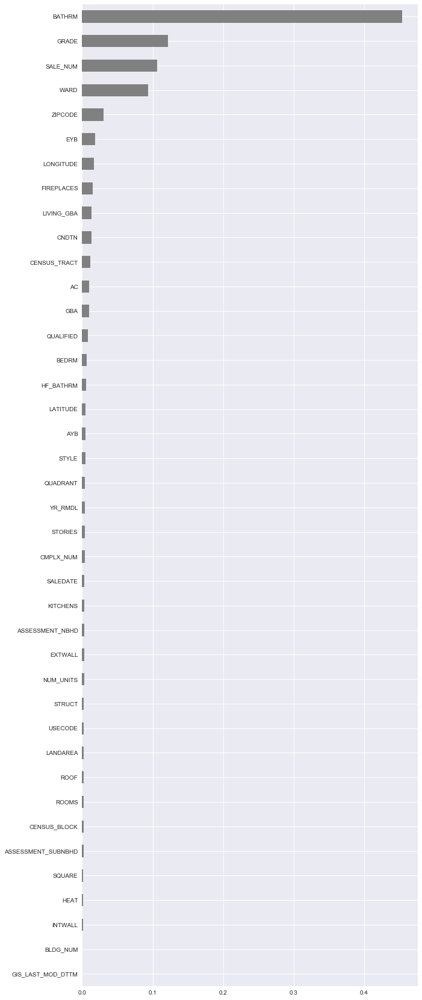

In [136]:
# plotting feature importances
%matplotlib inline

encoded_columns = encoder.transform(x_test).columns
importances = pd.Series(model.feature_importances_, encoded_columns)
plt.figure(figsize=(10,30))
importances.sort_values().plot.barh(color='grey');

In [113]:
test['PRICE'].head()

8753       720000.0
6399       635000.0
111731     472000.0
39925     1092500.0
89925      274000.0
Name: PRICE, dtype: float64

In [162]:
def shapforceplot(data, x):
    row = data.loc[[x]]

    explainer = shap.TreeExplainer(model)
    row_processed = processor.transform(row)
    shap_values = explainer.shap_values(row_processed)

    shap.initjs()
    shap_force_plot = shap.force_plot(
        base_value=explainer.expected_value, 
        shap_values=shap_values, 
        features=row
    )
    
    return shap_force_plot

shapforceplot(x_test, 8753)

In [160]:
shapforceplot(x_test, 6399)

In [158]:
shapforceplot(x_test, 111731)

In [159]:
shapforceplot(x_test, 39925)

In [161]:
shapforceplot(x_test, 89925)

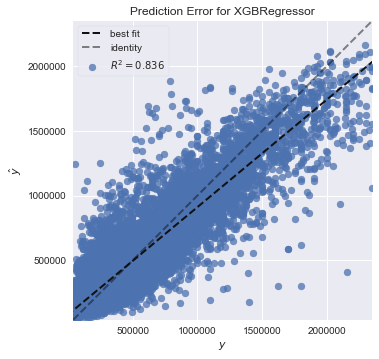

In [137]:
visualizer = PredictionError(model)

visualizer.fit(x_train_encoded, y_train)  
visualizer.score(x_test_encoded, y_test)  
visualizer.poof() 

plt.show()

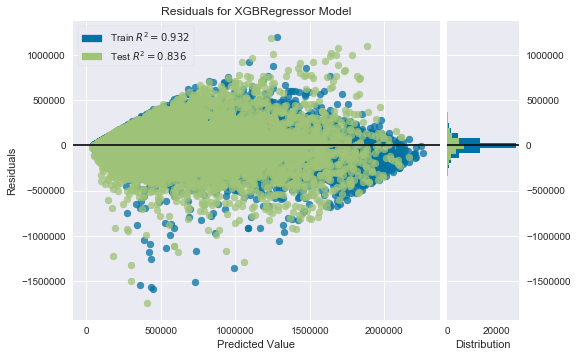

In [147]:
visualizer = ResidualsPlot(model)

visualizer.fit(x_train_encoded, y_train)  
visualizer.score(x_test_encoded, y_test)  
visualizer.poof() 

plt.show()